In [ ]:
# You will learn terms such as stationarity, residuals, trend, seasonality, autocorrelation
# We will first plot ts for visualization, decompose ts, identification of stationarity
# power transformations, identification of autocorrelation in ts

In [106]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from statsmodels.datasets import co2, get_rdataset
import numpy as np

In [107]:
co2_df = co2.load_pandas().data

In [108]:
print (co2_df)

              co2
1958-03-29  316.1
1958-04-05  317.3
1958-04-12  317.6
1958-04-19  317.5
1958-04-26  316.4
...           ...
2001-12-01  370.3
2001-12-08  370.8
2001-12-15  371.2
2001-12-22  371.3
2001-12-29  371.5

[2284 rows x 1 columns]


In [109]:
# forward fill
co2_df = co2_df.ffill()

In [117]:
air_passengers = get_rdataset('AirPassengers')

In [118]:
airp_df = air_passengers.data

In [119]:
print (airp_df)

            time  value
0    1949.000000    112
1    1949.083333    118
2    1949.166667    132
3    1949.250000    129
4    1949.333333    121
..           ...    ...
139  1960.583333    606
140  1960.666667    508
141  1960.750000    461
142  1960.833333    390
143  1960.916667    432

[144 rows x 2 columns]


In [120]:
airp_df.index = pd.date_range('1949', '1961', freq='M') 

airp_df.drop(columns=['time'], inplace=True)

In [121]:
print (airp_df)

            value
1949-01-31    112
1949-02-28    118
1949-03-31    132
1949-04-30    129
1949-05-31    121
...           ...
1960-08-31    606
1960-09-30    508
1960-10-31    461
1960-11-30    390
1960-12-31    432

[144 rows x 1 columns]


In [122]:
file = '/Users/alokbhardwaj/Dropbox/alok/books/statistics/time_series_analysis/packt/Time-Series-Analysis-with-Python-Cookbook.-main/datasets/Ch9/closing_price.csv'

In [123]:
closing_price = pd.read_csv(file,index_col='Date', parse_dates=True)

In [124]:
print (closing_price)

                  AAPL        MSFT         IBM
Date                                          
2019-01-11   62.830273  140.552994  115.847458
2019-04-11   63.242901  141.364731  117.676682
2019-05-11   63.152027  141.276733  117.864746
2019-06-11   63.179031  140.885513  118.625488
2019-07-11   63.908203  141.081116  119.083855
...                ...         ...         ...
2021-10-26  149.102402  309.543671  119.938713
2021-10-27  148.633087  322.579865  118.089584
2021-10-28  152.347656  323.757690  118.721680
2021-10-29  149.581696  331.014404  118.023544
2021-01-11  148.742920  328.768524  119.136795

[504 rows x 3 columns]


In [125]:
plt.rcParams["figure.figsize"] = (10,3)

<AxesSubplot:xlabel='Date'>

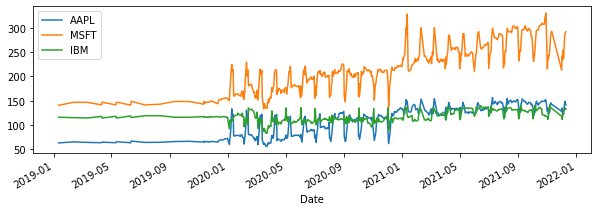

In [126]:
closing_price.plot()

<AxesSubplot:xlabel='Date'>

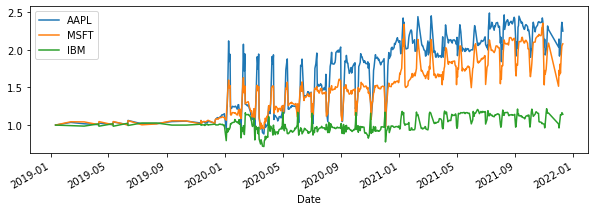

In [127]:
# normalize the data by dividing by first row to have same starting point
closing_price_n = closing_price.div(closing_price.iloc[0]) 

closing_price_n.plot()

In [128]:
print (closing_price_n.head())

                AAPL      MSFT       IBM
Date                                    
2019-01-11  1.000000  1.000000  1.000000
2019-04-11  1.006567  1.005775  1.015790
2019-05-11  1.005121  1.005149  1.017413
2019-06-11  1.005551  1.002366  1.023980
2019-07-11  1.017156  1.003757  1.027937


<AxesSubplot:xlabel='Date'>

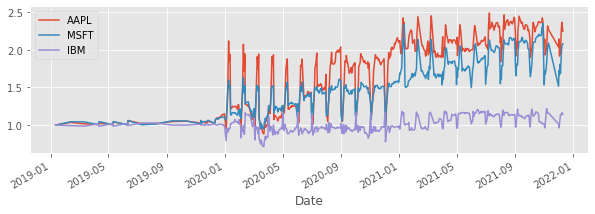

In [129]:
# change style of plot
plt.style.use('ggplot')
closing_price_n.plot()

<AxesSubplot:xlabel='Date'>

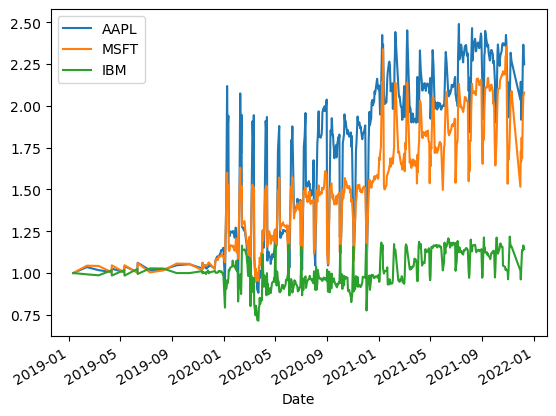

In [130]:
# revert to original theme
plt.style.use('default')
closing_price_n.plot()

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

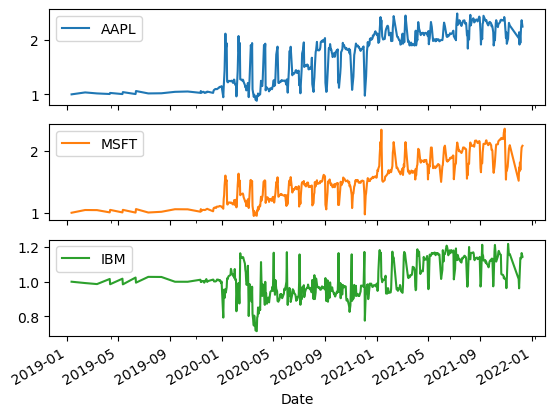

In [131]:
closing_price_n.plot(subplots=True)

In [132]:
# interactive plots
# install hvplot as conda install -c pyviz hvplot
import hvplot.pandas
import hvplot as hv

In [133]:
closing_price_n.hvplot(title='closing price plot using hvplot')

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

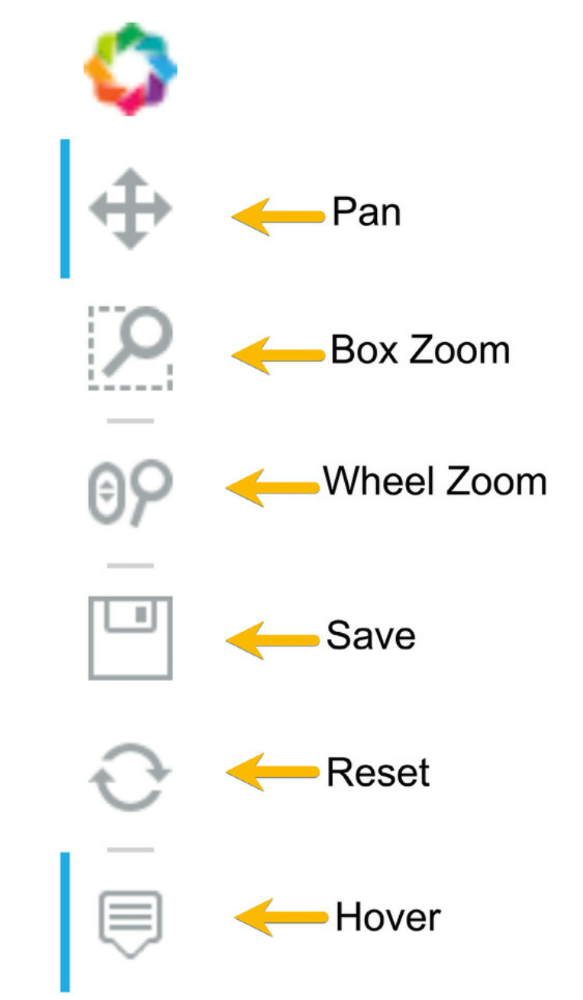

In [134]:
closing_price_n.hvplot(subplots=True)

:NdLayout   [Variable]
   :Curve   [Date]   (value)

In [135]:
closing_price_n.hvplot(subplots=True,width=500).cols(1)

:NdLayout   [Variable]
   :Curve   [Date]   (value)

In [136]:
(closing_price_n['AAPL'].hvplot(width=400) +  closing_price_n['MSFT'].hvplot(width=400)) 

:Layout
   .Curve.AAPL :Curve   [Date]   (AAPL)
   .Curve.MSFT :Curve   [Date]   (MSFT)

In [137]:
(closing_price_n['AAPL'].hvplot() *  closing_price_n['MSFT'].hvplot()) 

:Overlay
   .Curve.AAPL :Curve   [Date]   (AAPL)
   .Curve.MSFT :Curve   [Date]   (MSFT)

## Decomposing a time-series data

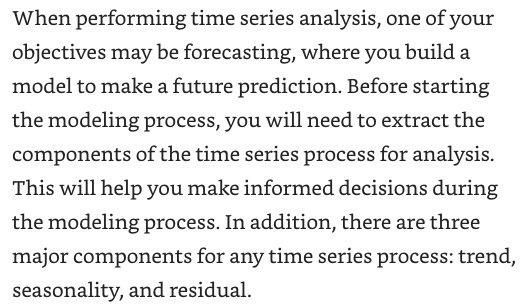

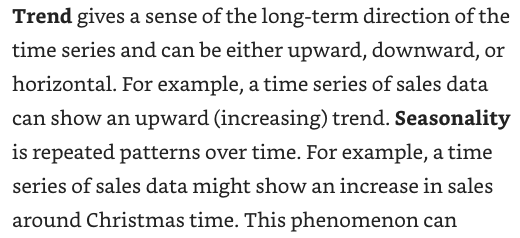

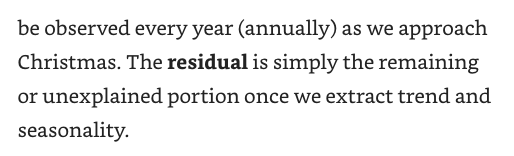

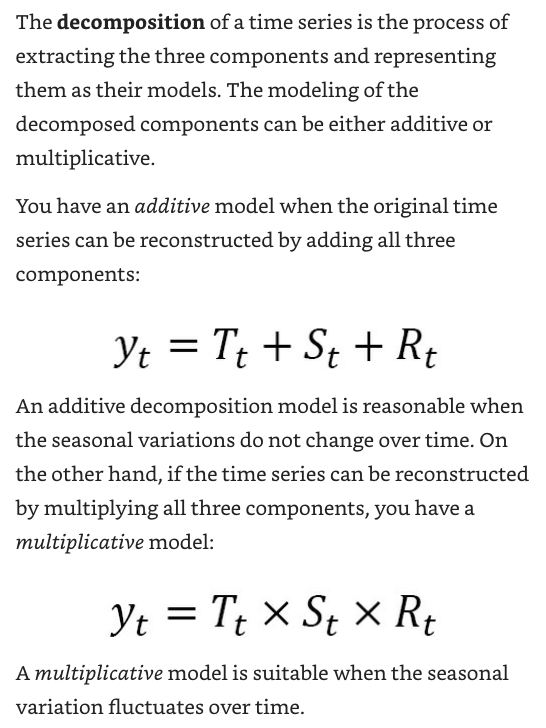

In [138]:
from statsmodels.tsa.seasonal import seasonal_decompose 

<AxesSubplot:>

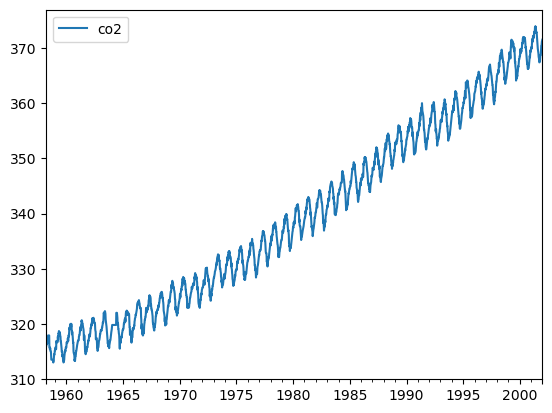

In [139]:
co2_df.plot()

##  CO2 Dataset indicates ________ model

<AxesSubplot:>

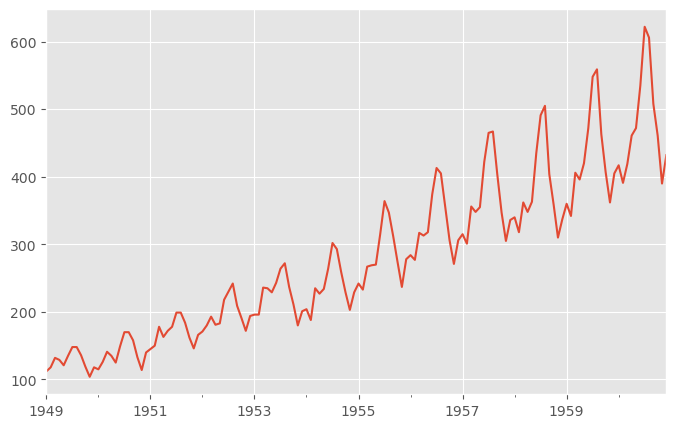

In [141]:
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (8,5)

airp_df['value'].plot()

##  Airport Passengers Dataset indicates ________ model

In [151]:
co2_decomposed = seasonal_decompose(co2_df,model='additive') 

air_decomposed = seasonal_decompose(airp_df,model='additive')

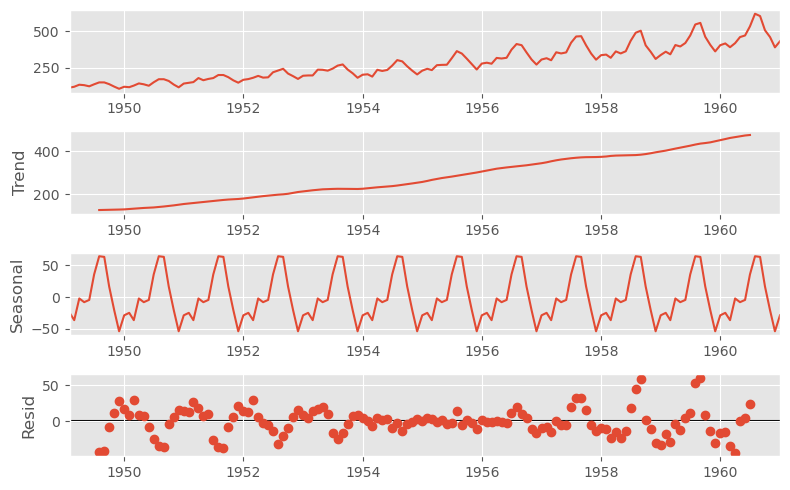

In [152]:
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (8,5)

air_decomposed.plot(); 

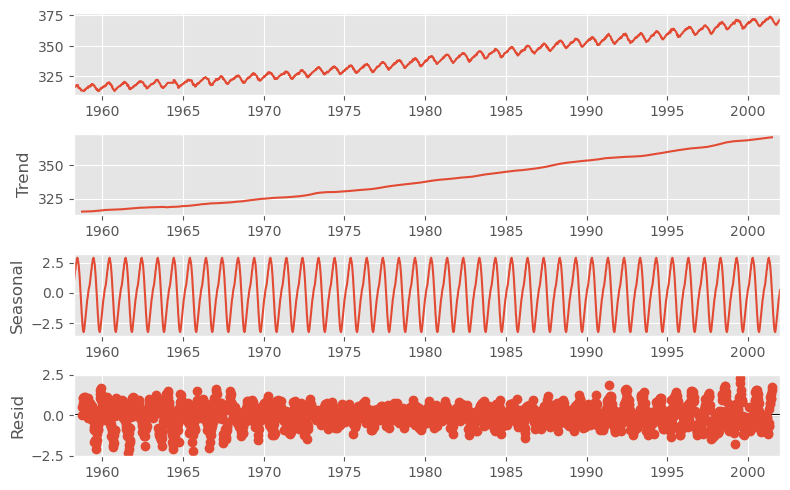

In [153]:
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (8,5)

co2_decomposed.plot(); 

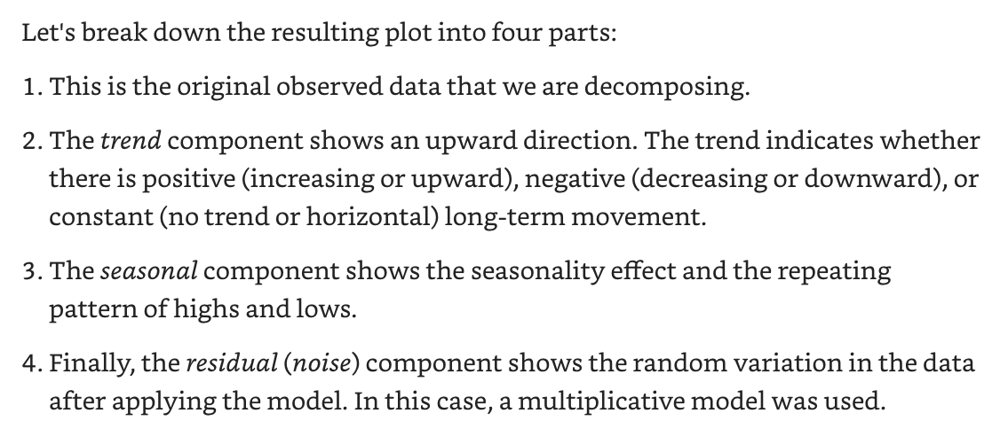

<AxesSubplot:>

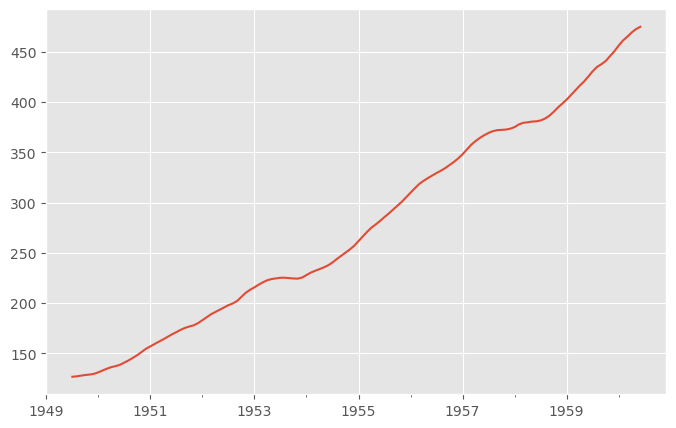

In [144]:
# reconstruct the original time-series
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (8,5)

#air_decomposed.trend.plot()
air_decomposed.seasonal.plot() 
#air_decomposed.resid.plot()
#air_decomposed.observed.plot()

<AxesSubplot:>

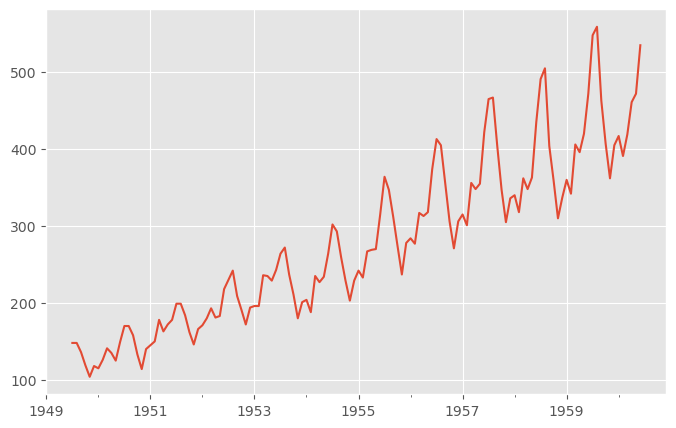

In [154]:
# reconstruct the original time-series
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (8,5)

(air_decomposed.trend + air_decomposed.seasonal + air_decomposed.resid).plot() 

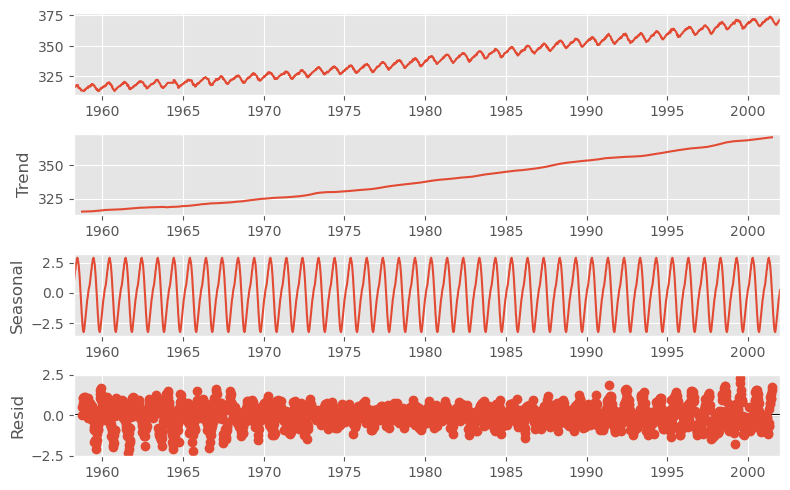

In [40]:
plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (8,5)

co2_decomposed.plot(); 

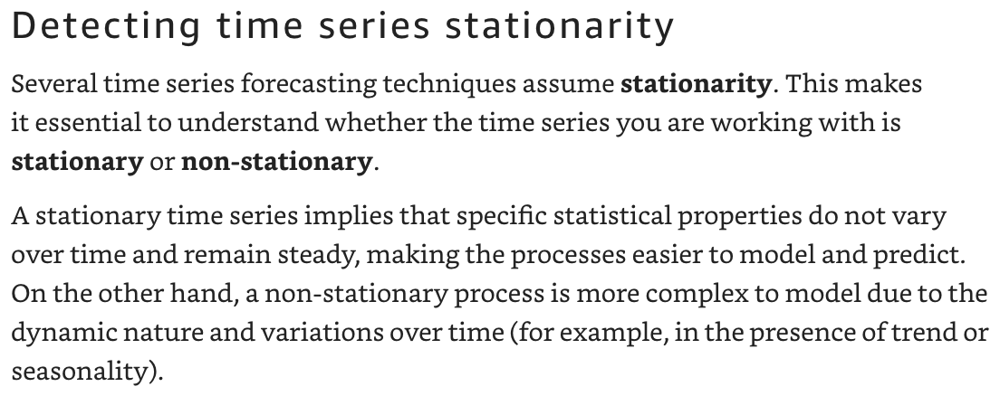

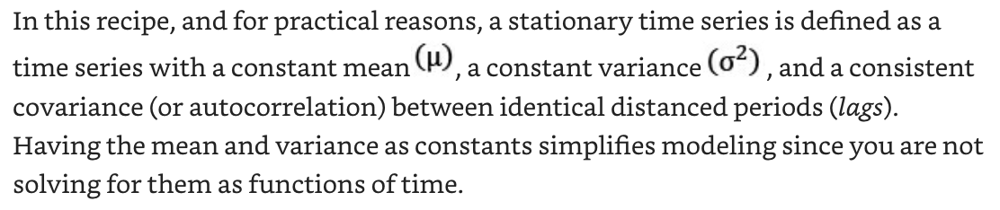

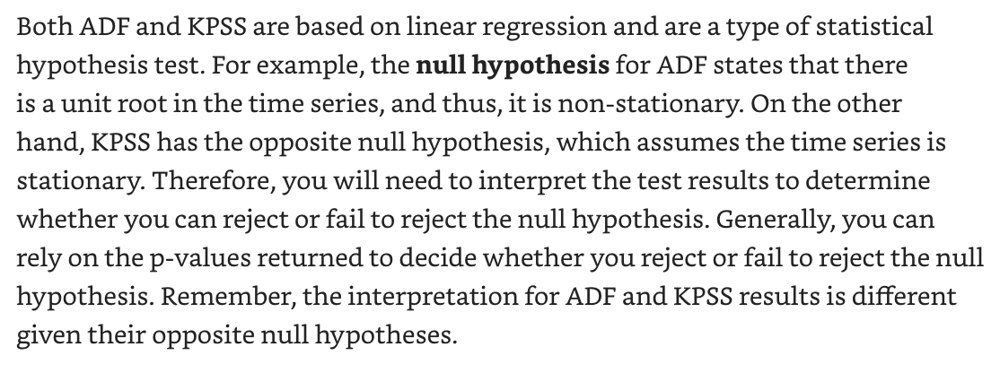

In [155]:
from statsmodels.tsa.stattools import adfuller, kpss

In [158]:
def print_results(output, test='adf'):     
    pval = output[1] 
    test_score = output[0] 
    lags = output[2]     
    decision = 'Non-Stationary' 
    if test == 'adf': 
        critical = output[4] 
        if pval < 0.05: 
            decision = 'Stationary' 
    
    elif test=='kpss': 
        critical = output[3] 
        if pval >= 0.05: 
            decision = 'Stationary'             
    
    output_dict = { 'Test Statistic': test_score, 
                   'p-value': pval, 
                   'Numbers of lags': lags, 
                   'decision': decision } 
    
    for key, value in critical.items(): 
        output_dict["Critical Value (%s)" % key] = value 
    
    return pd.Series(output_dict, name=test)

 

In [156]:
adf_output = adfuller(co2_df) 

kpss_output = kpss(co2_df) 

In [157]:
adfuller(co2_df)

(0.04605110843812388,
 0.9621787846784351,
 27,
 2256,
 {'1%': -3.4332519309441296,
  '5%': -2.8628219967376647,
  '10%': -2.567452466810334},
 2678.724132545794)

In [159]:
kpss(co2_df)

(7.649196300169511,
 0.01,
 29,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})

In [160]:
print_results(adf_output, 'adf')

Test Statistic                0.046051
p-value                       0.962179
Numbers of lags                     27
decision                Non-Stationary
Critical Value (1%)          -3.433252
Critical Value (5%)          -2.862822
Critical Value (10%)         -2.567452
Name: adf, dtype: object

In [161]:
# NULL Hypothesis for ADF is that series is non-stationary. If p-value is greater than 0.05, so H0 cannot be rejected

# NULL Hypothesis for KPSS is that series is stationary. If p-value is less than 0.05, so H0 can be rejected

pd.concat([ print_results(adf_output, 'adf'), print_results(kpss_output, 'kpss') ], axis=1)

,adf,kpss
Test Statistic,0.046051,7.649196
p-value,0.962179,0.01
Numbers of lags,27,29
decision,Non-Stationary,Non-Stationary
Critical Value (1%),-3.433252,0.739
Critical Value (5%),-2.862822,0.463
Critical Value (10%),-2.567452,0.347
Critical Value (2.5%),NaN,0.574


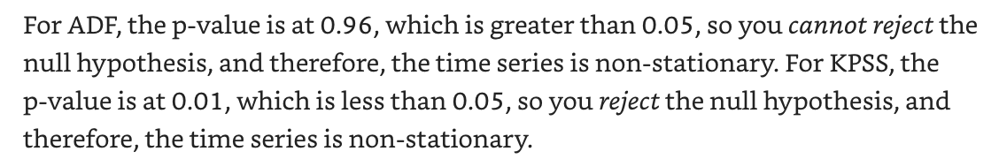

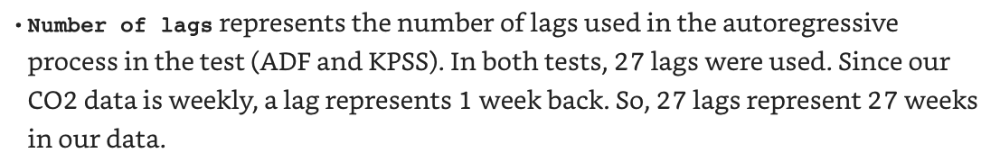

In [162]:
def check_stationarity(df): 
    kps = kpss(df) 
    adf = adfuller(df) 
    kpss_pv, adf_pv = kps[1], adf[1] 
    kpssh, adfh = 'Stationary', 'Non-stationary' 
    if adf_pv < 0.05: # Reject ADF Null Hypothesis 
        adfh = 'Stationary' 
    if kpss_pv < 0.05: # Reject KPSS Null Hypothesis 
        kpssh = 'Non-stationary' 
    return (kpssh, adfh)


In [163]:
def plot_comparison(methods, plot_type='line'): 
    n = len(methods) // 2 
    fig, ax = plt.subplots(n,2, sharex=True, figsize=(20,10)) 
    for i, method in enumerate(methods): 
        method.dropna(inplace=True) 
        name = [n for n in globals() if globals()[n] is method] 
        v, r = i // 2, i % 2 
        kpss_s, adf_s = check_stationarity(method) 
        method.plot(kind=plot_type,  
                    ax=ax[v,r],  
                    legend=False,  
                    title=f'{name[0]} --> KPSS: {kpss_s}, ADF {adf_s}') 
        ax[v,r].title.set_size(20) 
        method.rolling(52).mean().plot(ax=ax[v,r], legend=False)

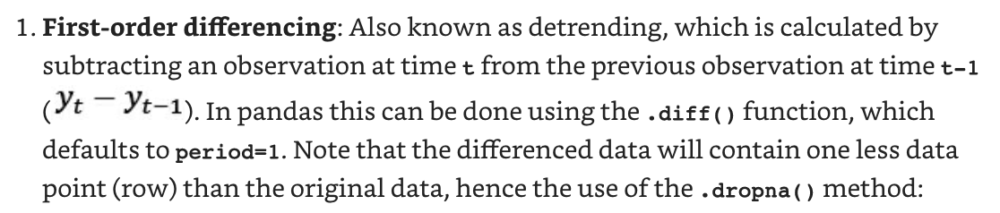

In [164]:
first_order_diff = co2_df.diff().dropna() 

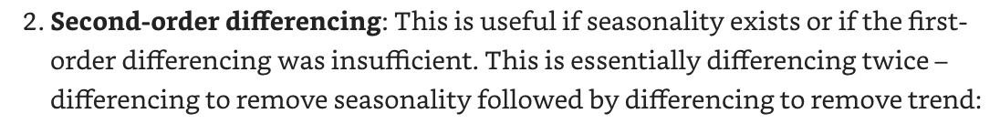

In [165]:
differencing_twice = co2_df.diff(52).diff().dropna() 

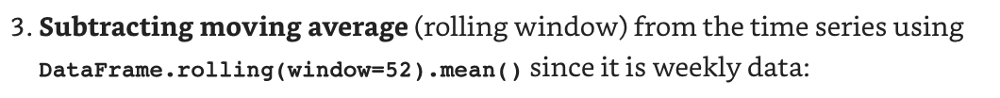

In [166]:
rolling = co2_df.rolling(window=52).mean() 
subtract_rolling_mean = co2_df - rolling 

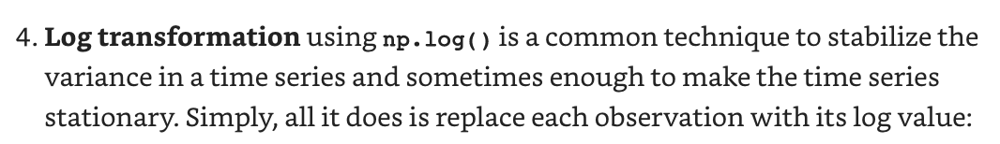

In [167]:
log_transform = np.log(co2_df) 

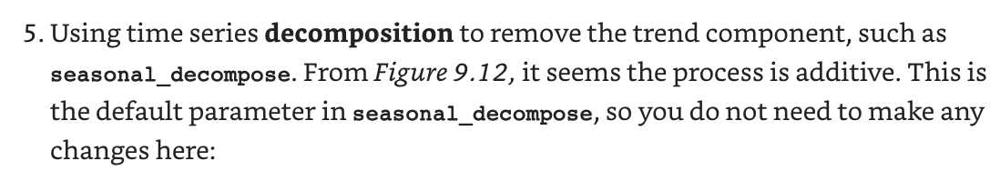

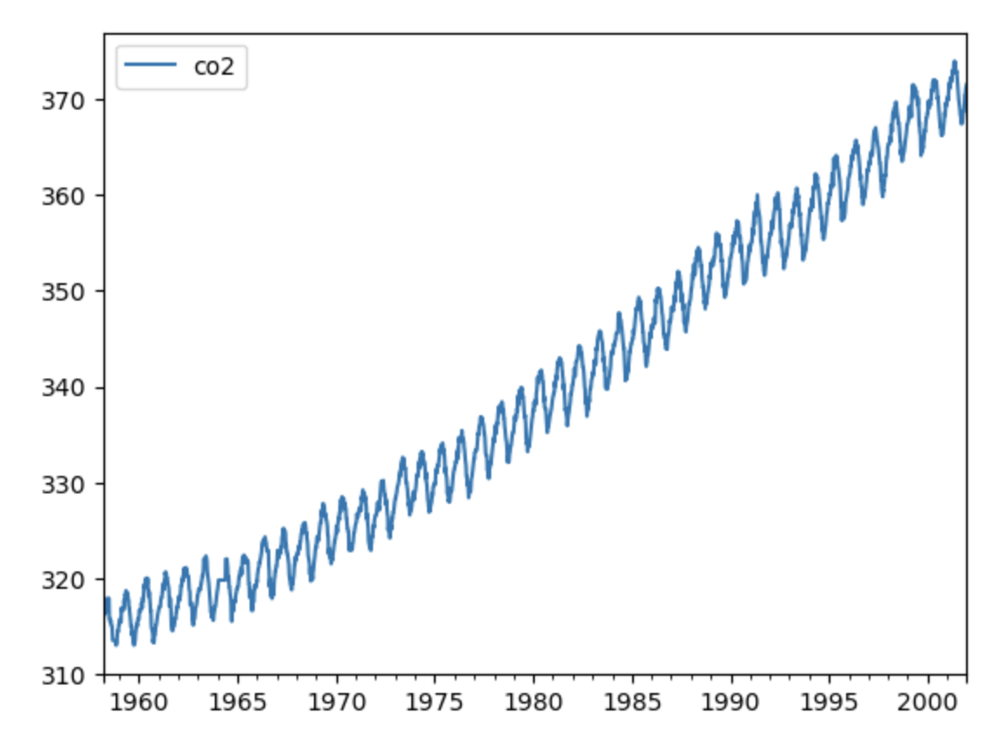

In [168]:
decomp = seasonal_decompose(co2_df) 

sd_detrend = decomp.observed - decomp.trend
 

IndexError: index 2 is out of bounds for axis 0 with size 2

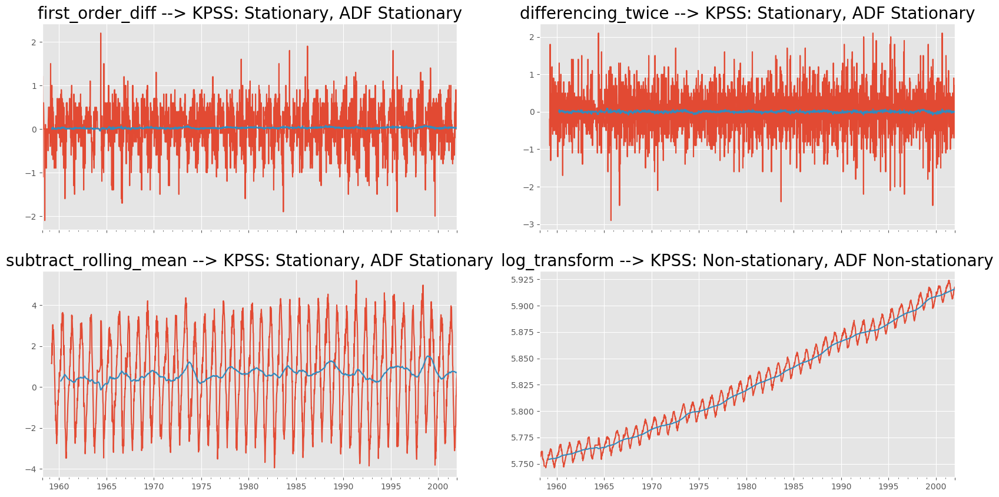

In [169]:
methods = [first_order_diff, differencing_twice,  subtract_rolling_mean, log_transform, sd_detrend] 

plot_comparison(methods)

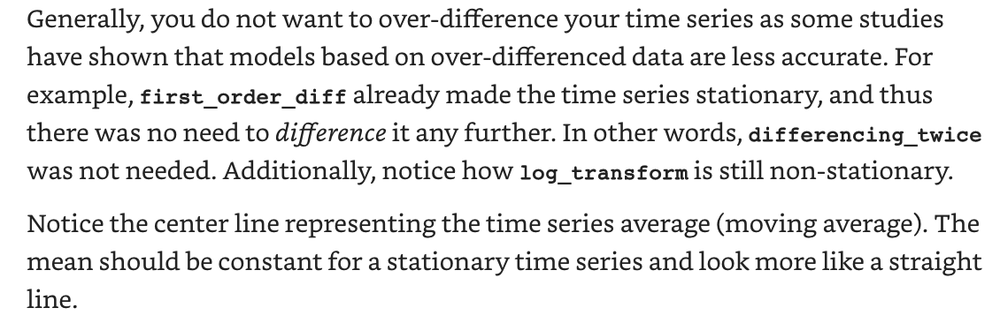

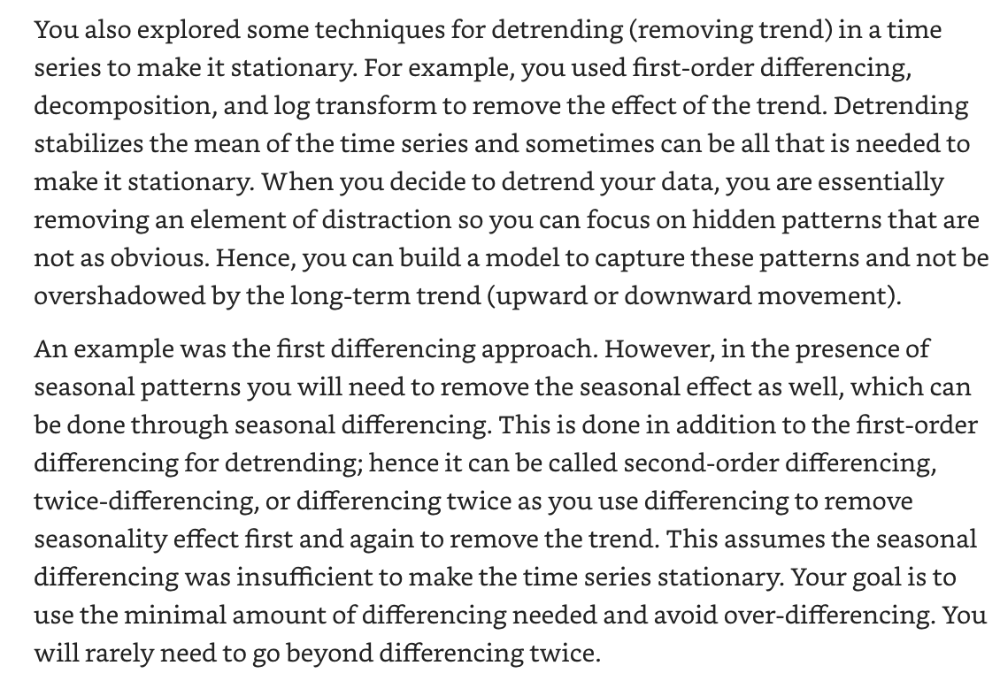

# Building Statistical Models

In [55]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import warnings 
from statsmodels.tsa.api import (kpss, adfuller, seasonal_decompose, STL) 
from statsmodels.tools.eval_measures import rmspe, rmse 
from sklearn.metrics import mean_absolute_percentage_error as mape 
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf 
from itertools import product 
from pathlib import Path 
warnings.filterwarnings('ignore') 
plt.rcParams["figure.figsize"] = [12, 5]


In [69]:
life_file = '/Users/alokbhardwaj/Dropbox/alok/books/statistics/time_series_analysis/packt/Time-Series-Analysis-with-Python-Cookbook.-main/datasets/Ch10/life_expectancy_birth.csv'

life = pd.read_csv(life_file, index_col='year',parse_dates=True)

print (life.head())
print (life.tail())
 

                value
year                 
1960-01-01  69.123902
1961-01-01  69.760244
1962-01-01  69.149756
1963-01-01  69.248049
1964-01-01  70.311707
                value
year                 
2015-01-01  82.543902
2016-01-01  83.243902
2017-01-01  82.946341
2018-01-01  83.346341
2019-01-01  83.197561


In [95]:
milk_file = '/Users/alokbhardwaj/Dropbox/alok/books/statistics/time_series_analysis/packt/Time-Series-Analysis-with-Python-Cookbook.-main/datasets/Ch10/milk_production.csv'

milk = pd.read_csv(milk_file, index_col='month', parse_dates=True)

print (milk.head())

print (milk.tail())
 

            production
month                 
1962-01-01         589
1962-02-01         561
1962-03-01         640
1962-04-01         656
1962-05-01         727
            production
month                 
1975-08-01         858
1975-09-01         817
1975-10-01         827
1975-11-01         797
1975-12-01         843


<AxesSubplot:title={'center':'Monthly Milk Production'}, xlabel='month'>

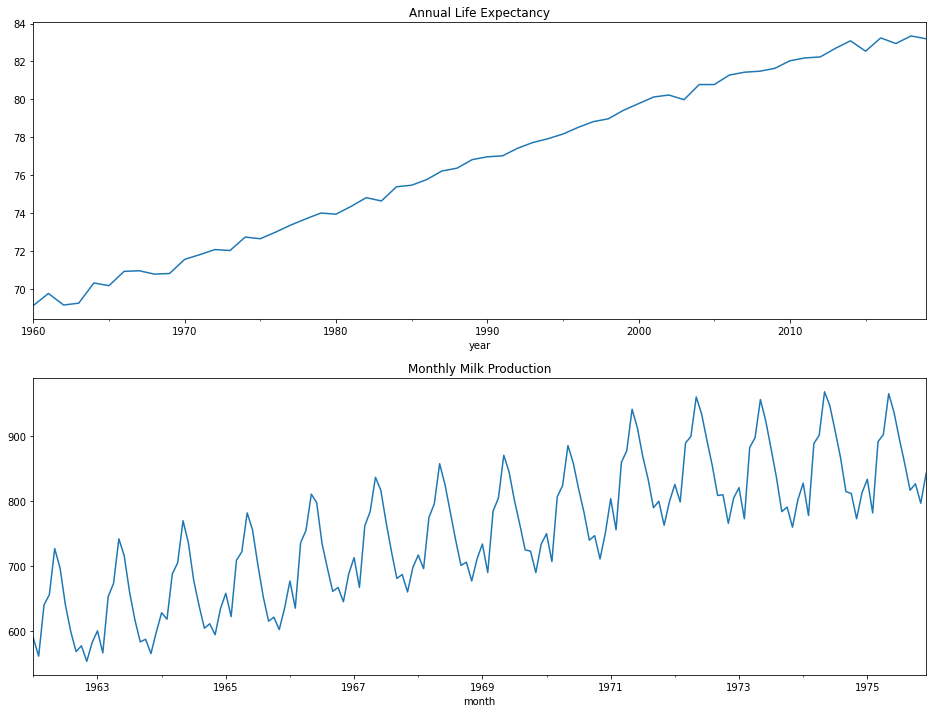

In [96]:
fig, ax = plt.subplots(2, 1, figsize=(16, 12)) 
life.plot(title='Annual Life Expectancy', legend=False, ax=ax[0]) 
milk.plot(title='Monthly Milk Production', legend=False, ax=ax[1])
 

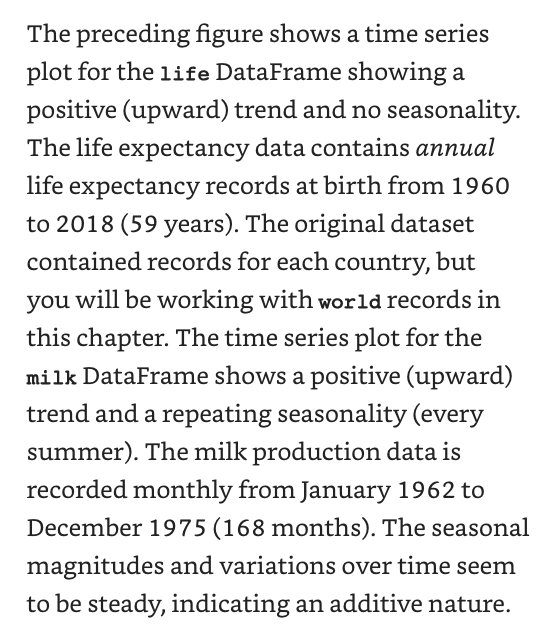

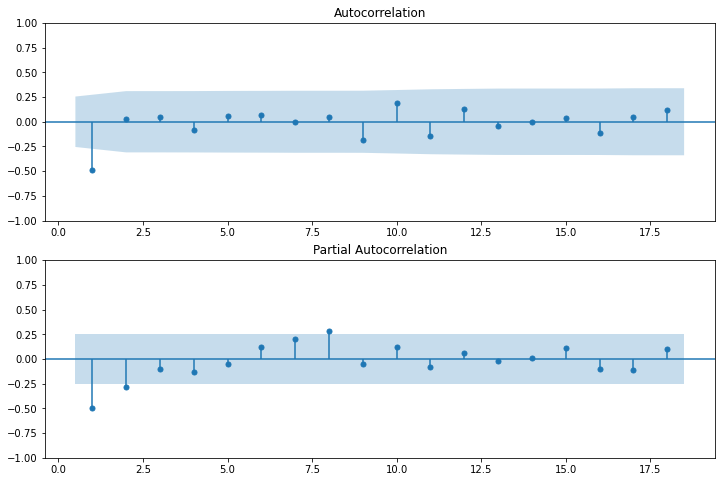

In [72]:
life_diff = life.diff().dropna() 
fig, ax = plt.subplots(2,1, figsize=(12,8)) 
plot_acf(life_diff, zero=False, ax=ax[0]) 
plot_pacf(life_diff, zero=False, ax=ax[1]) 
plt.show()

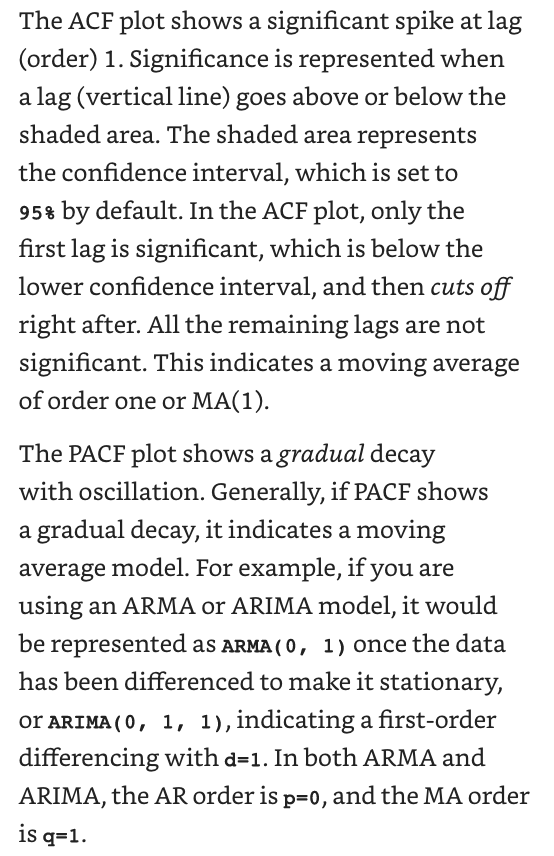

In [73]:
from statsmodels.tsa.api import ExponentialSmoothing

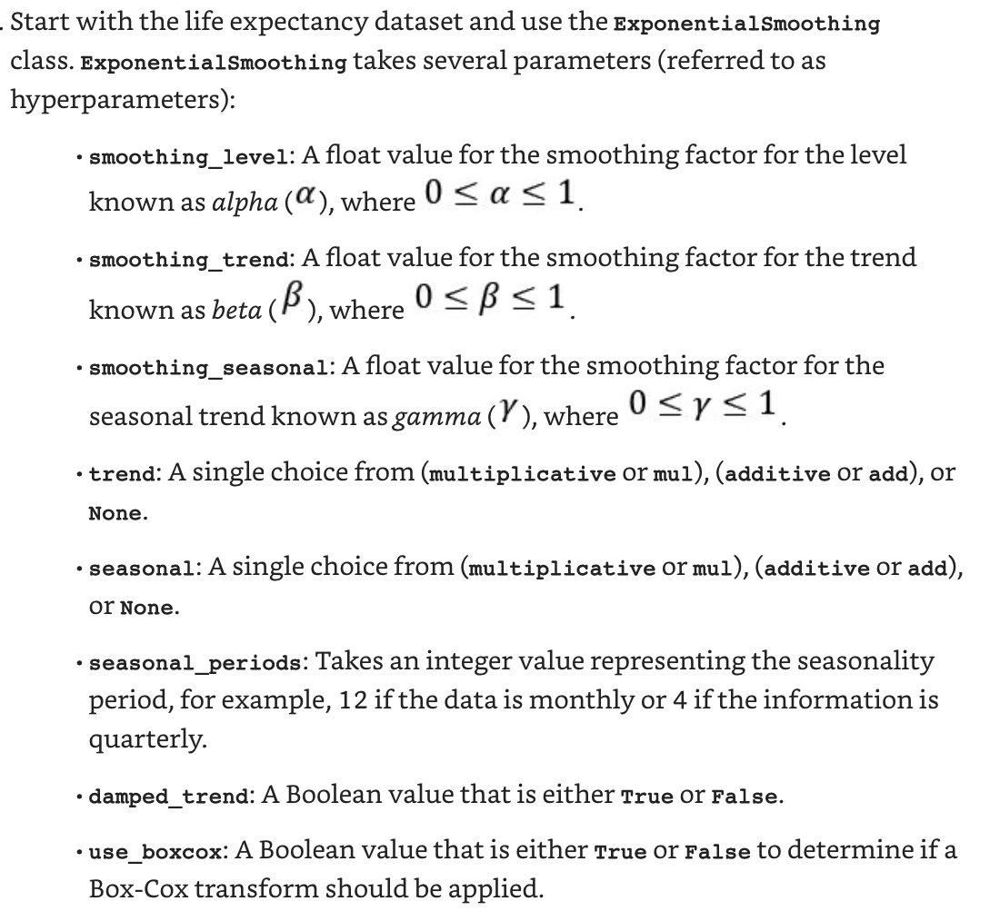

In [74]:
def combinator(items): 
    combo = [i for i in product(*items)] 
    return combo


In [75]:
def get_best_model(score, c='AIC'): 
    initial_score = score[0][c] 
    best_model = 0 
    for k,v in score.items(): 
        if v[c] < initial_score: 
            initial_score = v[c] 
            best_model = k 
            print(f'Best model: {best_model} with lowest {c} score: {initial_score}') 
            return score[best_model]['model'] 

In [76]:
trend = ['add', 'mul'] 
damped = [True, False] 
life_ex_comb = combinator([trend, damped])

print (life_ex_comb)
 

[('add', True), ('add', False), ('mul', True), ('mul', False)]


In [97]:
def split_data(data, test_split): 
    l = len(data) 
    t_idx = round(l*(1-test_split)) 
    train, test = data[ : t_idx], data[t_idx : ] 
    print(f'train: {len(train)} , test: {len(test)}') 
    return train, test
 
test_split = 0.15 
milk_train, milk_test = split_data(milk, test_split) 
life_train, life_test = split_data(life, test_split)
 

train: 143 , test: 25
train: 51 , test: 9


In [78]:
train = life_train.values.ravel() 

y = life_test.values.ravel()

In [79]:
score = {}

In [80]:
for i, (t, dp) in enumerate(life_ex_comb): 
    print (i)
    print (t)
    print (dp)
    exp = ExponentialSmoothing(train, 
                               trend=t, 
                               damped_trend=dp, seasonal=None) 
    model = exp.fit(use_brute=True, optimized=True)     
    y_hat = model.forecast(len(y))
    print (t)
    print (dp)
    print (model.aic)
    print (model.bic)
    print (model.aicc)
    print (rmspe(y,y_hat))
    print (model)
    
    score[i] = {'trend':t,'damped':dp,'AIC':model.aic,'BIC':model.bic,'AICc':model.aicc,'model': model}

0
add
True
add
True
-137.6094099090296
-127.95028174540798
-135.0047587462389
0.06170556275327801
1
add
False
add
False
-140.6702642442567
-132.9429617133594
-138.7611733351658
0.07617324176346495
2
mul
True
mul
True
-138.56405934111802
-128.9049311774964
-135.95940817832732
0.07294357588103632
3
mul
False
mul
False
-139.92994985083226
-132.20264731993495
-138.02085894174135
0.07906680478480595


In [81]:
life_best_model = get_best_model(score, 'AIC') 

Best model: 1 with lowest AIC score: -140.6702642442567


In [82]:
life_best_model.summary()

Dep. Variable:,endog,No. Observations:,51
Model:,ExponentialSmoothing,SSE,2.764
Optimized:,True,AIC,-140.670
Trend:,Additive,BIC,-132.943
Seasonal:,None,AICC,-138.761
Seasonal Periods:,None,Date:,"Wed, 24 Aug 2022"
Box-Cox:,False,Time:,06:50:03
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.1709215,alpha,True
smoothing_trend,0.1709215,beta,True


In [83]:
def plot_forecast(model, start, train, test): 
    forecast = pd.DataFrame(model.forecast(test.shape[0]), index=test.index) 
    ax = train.loc[start:].plot(style='--') 
    test.plot(ax=ax) 
    forecast.plot(ax=ax, style = '-.') 
    ax.legend(['orig_train', 'orig_test', 'forecast'])
    plt.show()

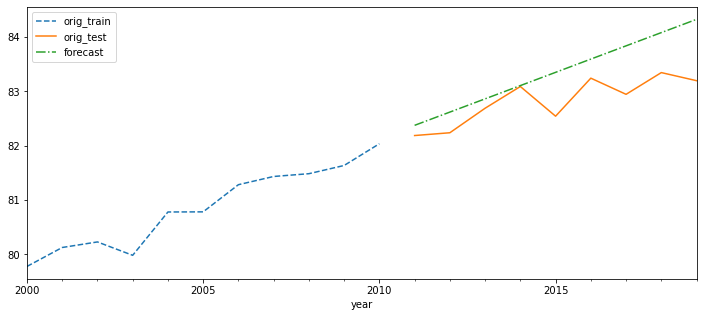

In [84]:
plot_forecast(life_best_model, '2000', life_train, life_test) 

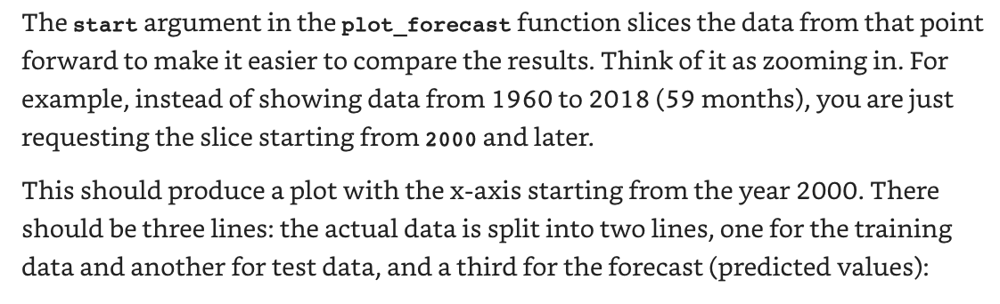

In [98]:
trend , damped= ['add', 'mul'], [True, False] 

seasonal, periods = ['add' , 'mul'], [4, 6, 12] 

milk_exp_comb = combinator([trend, damped, seasonal, periods]) 

print (milk_exp_comb)

[('add', True, 'add', 4), ('add', True, 'add', 6), ('add', True, 'add', 12), ('add', True, 'mul', 4), ('add', True, 'mul', 6), ('add', True, 'mul', 12), ('add', False, 'add', 4), ('add', False, 'add', 6), ('add', False, 'add', 12), ('add', False, 'mul', 4), ('add', False, 'mul', 6), ('add', False, 'mul', 12), ('mul', True, 'add', 4), ('mul', True, 'add', 6), ('mul', True, 'add', 12), ('mul', True, 'mul', 4), ('mul', True, 'mul', 6), ('mul', True, 'mul', 12), ('mul', False, 'add', 4), ('mul', False, 'add', 6), ('mul', False, 'add', 12), ('mul', False, 'mul', 4), ('mul', False, 'mul', 6), ('mul', False, 'mul', 12)]


In [99]:
train = milk_train.values.ravel() 

y = milk_test.values.ravel()


In [100]:
milk_model_scores = {} 

In [101]:
for i, (t, dp, s, sp) in enumerate(milk_exp_comb): 
    
    exp = ExponentialSmoothing(train, trend=t, damped_trend=dp, seasonal=s, seasonal_periods=sp) 
    
    model = exp.fit(use_brute=True, optimized=True)     
    
    y_hat = model.forecast(len(y))
    
    milk_model_scores[i] = {'trend':t, 
                            'damped':dp, 
                            'AIC':model.aic, 
                            'BIC':model.bic, 
                            'AICc': model.aicc, 
                            'model': model} 

In [102]:
print (milk_model_scores)

{0: {'trend': 'add', 'damped': True, 'AIC': 1102.523994856811, 'BIC': 1129.18959652915, 'AICc': 1104.5392620323835, 'model': <statsmodels.tsa.holtwinters.results.HoltWintersResultsWrapper object at 0x7f986f0c7670>}, 1: {'trend': 'add', 'damped': True, 'AIC': 1076.0398617560552, 'BIC': 1108.6311526889142, 'AICc': 1078.8615671824118, 'model': <statsmodels.tsa.holtwinters.results.HoltWintersResultsWrapper object at 0x7f986fd70700>}, 2: {'trend': 'add', 'damped': True, 'AIC': 595.5627335708311, 'BIC': 645.9310922852495, 'AICc': 601.741595359449, 'model': <statsmodels.tsa.holtwinters.results.HoltWintersResultsWrapper object at 0x7f986fd70e50>}, 3: {'trend': 'add', 'damped': True, 'AIC': 1093.0225165351126, 'BIC': 1119.6881182074517, 'AICc': 1095.037783710685, 'model': <statsmodels.tsa.holtwinters.results.HoltWintersResultsWrapper object at 0x7f986fda13d0>}, 4: {'trend': 'add', 'damped': True, 'AIC': 1072.1356980760918, 'BIC': 1104.7269890089508, 'AICc': 1074.9574035024484, 'model': <statsmo

In [103]:
milk_model = get_best_model(milk_model_scores) 

Best model: 1 with lowest AIC score: 1076.0398617560552


In [104]:
milk_model.summary() 

Dep. Variable:,endog,No. Observations:,143
Model:,ExponentialSmoothing,SSE,227237.898
Optimized:,True,AIC,1076.040
Trend:,Additive,BIC,1108.631
Seasonal:,Additive,AICC,1078.862
Seasonal Periods:,6,Date:,"Wed, 24 Aug 2022"
Box-Cox:,False,Time:,07:04:45
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.9950412,alpha,True
smoothing_trend,0.0083004,beta,True


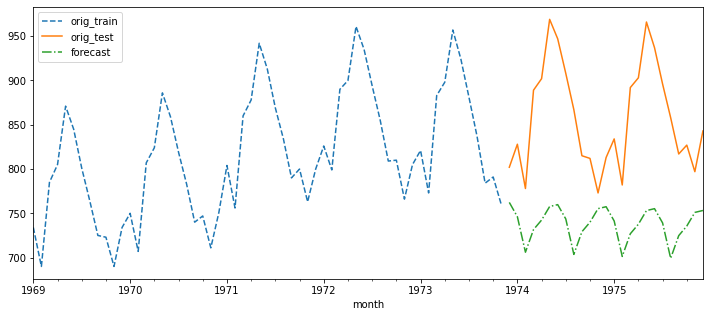

In [105]:
plot_forecast(milk_model, '1969', milk_train, milk_test) 